<a href="https://colab.research.google.com/github/leonard-sanya/mlfc_miniproject/blob/main/notebooks/Distribution_of_healthcare_facilities_in_Kenya.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Machine Learning Foundation Course Mini_project**

###**Done by: Leonard Sanya**

### **September 2025**

# **Abstract**

This project investigates the spatial distribution of healthcare facilities in Kenya and its relationship to population needs by integrating diverse datasets, including the 2019 Census population data, county boundary GeoJSON files, and healthcare facility records. Additional geographic features are extracted from OpenStreetMap to enrich the analysis. The study follows the *Access–Assess–Address* framework: data are accessed and preprocessed, assessed through exploratory data analysis, visualization, and correlation checks, and then addressed with predictive modeling. Logistic Regression and Naïve Bayes classifiers are applied to identify underserved regions, with model performance evaluated using ROC curves and confusion matrices.


#**Access**

### **1.1 Installation and Importing Libraries**

In [1]:
# Step 1: Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
%%capture
%pip uninstall --yes fynesse
%pip install https://github.com/leonard-sanya/mlfc_miniproject.git
%pip install osmnx
%pip install contextily

In [3]:
import os, subprocess, importlib, sys

def load_repo(repo):
    local = repo.split("/")[-1]
    if not os.path.exists(local):
        subprocess.run(["git", "clone", f"https://github.com/{repo}.git"], check=True)
    else:
        subprocess.run(["git", "-C", local, "pull"], check=True)
    if local not in sys.path:
        sys.path.insert(0, local)
    mod = importlib.import_module(local)
    importlib.reload(mod)
    return mod
fynesse = load_repo("leonard-sanya/mlfc_miniproject")

In [4]:
import os
import pandas as pd
import numpy as np
import zipfile
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
from google.colab import files
import osmnx as ox
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import fynesse
from fynesse import address


### **1.2 Legal Copyright**

In [5]:
fynesse.access.show_copyright_info()


                       MIT License
    Copyright (c) 2025 Leonard Sanya

    Permission is hereby granted, free of charge, to any person obtaining a copy
    of this software and associated documentation files (the "Software"), to deal
    in the Software without restriction, including without limitation the rights
    to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
    copies of the Software, and to permit persons to whom the Software is
    furnished to do so, subject to the following conditions:

    The above copyright notice and this permission notice shall be included in all
    copies or substantial portions of the Software.

    THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
    IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
    FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
    AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
    LIABILITY, WHETHE

### **1.3 Downloading Data**

In this project, we will be working with the following datasets that are stored in a github repo [here](https://github.com/leonard-sanya/mlfc_miniproject.git)

#### **1.3.1 Healthcare Facilities Data**

The healthcare facilities dataset provides a comprehensive listing of health institutions across Kenya, including hospitals, clinics, dispensaries, and other types of medical centers. It contains key attributes such as facility type, name, and geographic location (coordinates), making it suitable for spatial analysis and integration with population and boundary data.

This dataset was obtained from the **EnergyData.info platform**, which hosts open datasets on energy and related areas. The specific dataset used is available here: 🔗 [Kenya Healthcare Facilities – EnergyData.info](https://energydata.info/dataset/kenya-healthcare-facilities).

#### **1.3.2 Population Dataset (2019 Kenya Census)**

The population dataset provides official demographic counts from the 2019 Kenya Population and Housing Census, disaggregated at the county level. It includes the total population per county, as recorded by the Kenya National Bureau of Statistics, and serves as a key reference for demographic and spatial analysis. This dataset is particularly useful when combined with boundary and service delivery datasets (such as healthcare facilities) to understand population distribution, resource allocation, and planning needs.

This was pre-downloaded as CSV from 🔗 [Kenya Population per County – HDX](https://data.humdata.org/dataset/kenya-population-per-county-from-census-report-2019) and  uploaded to Google Colab for analysis


#### **1.3.3 Kenya County Boundaries Dataset (GeoJSON)**

The county boundaries dataset provides the official administrative boundaries of Kenya at the county level, formatted as a GeoJSON file. It contains geographic polygons representing each of the 47 counties, making it suitable for spatial analysis, visualization, and integration with other datasets. This dataset is useful for mapping, and any analysis requiring county-level geographic delineation.

It was pre-downloaded from 🔗 [Kenya County Boundaries – HDX](https://data.humdata.org/dataset/json-repository/resource/51939d78-35aa-4591-9831-11e61e555130) and loaded for spatial processing and analysis.

In [6]:
df_health_facilities = fynesse.access.load_datasets("/content/mlfc_miniproject/data/healthcare_facilities.csv")
df_population = fynesse.access.load_datasets("/content/mlfc_miniproject/data/2019-population_census-report-per-county.csv")
gdf_counties = gpd.read_file("/content/mlfc_miniproject/data/kenya.geojson")


Loading dataset from /content/mlfc_miniproject/data/healthcare_facilities.csv ...
Dataset loaded: (10013, 13)
Loading dataset from /content/mlfc_miniproject/data/2019-population_census-report-per-county.csv ...
Dataset loaded: (47, 11)


#### **1.3.4 Geospatial data collection and feature extraction using OpenStreetMap (OSM)**

* We automatically queries **Points of Interest (POIs)** from OSM within a defined radius (1 km, or configurable).

2. **Features of Interest**
   The `features` list defines which **types of Points of Interest (POIs)** to extract from OpenStreetMap, e.g.:

   * `building`
   * `amenity:school`
   * `amenity:hospital`
   * `tourism:hotel`
   * `leisure:park`
* It collects information about the **built environment and amenities** surrounding given facilities, such as:
  * Number of buildings
  * Number of schools, hospitals, cafes, and restaurants
  * Availability of tourism sites (hotels, museums)
  * Recreational spaces (parks, leisure facilities)
  * Religious institutions (places of worship)
* For each facility location, it produces a **feature vector** which are then organized into a **DataFrame** and saved as a `.csv`, enabling comparison between different facilities or counties.




In [7]:
features = [("building", None),("amenity", None),("amenity", "school"),("amenity", "hospital"),("amenity", "restaurant"),
 ("amenity", "cafe"),("shop", None),("tourism", None),("tourism", "hotel"),("tourism", "museum"),("leisure", None),
  ("leisure", "park"),("historic", None),("amenity", "place_of_worship"),]

facility_dict = {f"{row['Facility_N']}, {row['County']}": { "latitude": row["Latitude"],"longitude": row["Longitude"]}
    for _, row in df_health_facilities.iterrows()}

"""Then commented line of code runned for 26258.04 seconds and saved the output as geo_features_county_1km.csv which is then loaded for analysis."""
# geo_features_county_1km = fynesse.access.build_feature_dataframe(facility_dicts=facility_dict, features=features, box_size_km=1)
df_osm_geo_features = fynesse.access.load_datasets("/content/mlfc_miniproject/data/geo_features_county_1km copy.csv")

Loading dataset from /content/mlfc_miniproject/data/geo_features_county_1km copy.csv ...
Dataset loaded: (9994, 15)


## 1.4 **Summary**
The data access phase involved gathering and loading multiple complementary datasets to provide a foundation for spatial and demographic analysis. These included the 2019 Kenya Population and Housing Census data (population counts by county), healthcare facilities data (locations and attributes of hospitals, clinics, and other medical centers), and county boundary shapefiles (GeoJSON format). Additional geospatial features such as buildings, schools, hospitals, and amenities were collected directly from OpenStreetMap using the OSMnx library, which allowed automated extraction of points of interest within defined areas around selected facilities. All datasets were accessed through open data portals such as the Humanitarian Data Exchange (HDX) and EnergyData.info, then loaded into Google Colab via CSV or GeoJSON uploads for integration and further analysis.


#***Assess***

## **2.1 Data Inspection**


## **2.2 Data Cleaning**

Different datasets often come from different sources, each using its own naming conventions. For example, population data might label the county column as `"County"`, healthcare facilities as `"COUNTY_NAM"`, and shapefiles as `"county_"`. If you try to join or compare these datasets without fixing this, you’ll run into mismatches and errors.

#### **2.2.1 Standardization**
This step ensures data interoperability making sure all datasets share a common county column names.


In [8]:
possible_names = ["County", "COUNTY_NAM",'county_']

df_population =  fynesse.assess.standardize_county_column(df_population,possible_names )
df_osm_geo_features = fynesse.assess.standardize_county_column(df_osm_geo_features, possible_names)
df_health_facilities = fynesse.assess.standardize_county_column(df_health_facilities,possible_names )
gdf_counties = fynesse.assess.standardize_county_column(gdf_counties, possible_names)


#### **2.2.2 Harmonization**

We validate that all 47 county names are the same across different datasets and renames where necessary to ensure that there is consistency across datasets. For example, counties like `"Murang'A"` and `"muranga"`are ramed to `"Murang'a"`

In [9]:
county_name_mapping = {'Tharaka Nithi': 'Tharaka - Nithi','Tharaka-Nithi': 'Tharaka - Nithi','Elgeyo Marakwet':'Elegeyo-Marakwet',
                       'Elgeyo-Marakwet':'Elegeyo-Marakwet','Murang\'a':'Murang\'A'}

df_population, df_health_facilities,df_osm_geo_features = fynesse.assess.harmonize_county_names(df_population,df_health_facilities,
                                                                                                df_osm_geo_features,gdf_counties,county_name_mapping)



Harmonizing county names...
Counties in population but not in GeoJSON: {'Tharaka-Nithi', 'Elgeyo-Marakwet'} 

Counties in health_facilities but not in GeoJSON: {'Tharaka Nithi', 'Elgeyo Marakwet'} 

Counties in osm geo features but not in GeoJSON: set() 

Harmonization complete.


## **2.3 Feature Selection**


In [10]:
high_demand_facilities = [ "Dispensary","Medical Clinic", "Health Centre","District Hospital","Sub-District Hospital","Provincial General Hospital",
                          "National Referral Hospital","Maternity Home","Laboratory (Stand-alone)","Dental Clinic"]

subset_health_facilities = df_health_facilities[df_health_facilities['Type'].isin(high_demand_facilities)]
subset_health_facilities.head()


,OBJECTID,Facility_N,Type,Owner,County,Sub_County,Division,Location,Sub_Locati,Constituen,Nearest_To,Latitude,Longitude
0,1,CDF Kiriari Dispensary,Dispensary,Ministry of Health,Embu,Manyatta,Manyatta,Ruguru,Ruguru,MANYATTA,Kiriari -market,-0.39940,37.47605
1,2,St Jude's Huruma Community Health Services,Medical Clinic,Private Practice - Unspecified,Nairobi,Mathare,Huruma,Huruma,Huruma,MATHARE,Kariobangi Market,-1.26174,36.87765
2,3,12 Engineers,Dispensary,Ministry of Health,Kiambu,Thika West,,,,JUJA,,-1.07354,37.14413
4,5,8Th Street Clinic,Medical Clinic,Private Enterprise (Institution),Kajiado,Kajiado North,Isinya,Isinya,Isinya Township,KAJIADO NORTH,Isinya,-1.41187,36.50854
5,6,AAR Adams Health Centre,Medical Clinic,Private Practice - General Practitioner,Nairobi,Kibra,Woodly,Woodly,Woodly,KIBRA,Adams,-1.30047,36.73162


In [11]:
df_facility_type_counts = (subset_health_facilities.groupby('Type').size().reset_index(name='Count').fillna(0).reset_index())
preprocessed_data = fynesse.assess.data_preprocess(df_population, subset_health_facilities, hospital_threshold=15)
preprocessed_data.head()

,County,Total_Population19,Population Density,Facility Count,Hospital_per_100k,Underserved
0,Baringo,666763,61,216,32.395319,1
1,Bomet,875689,346,130,14.845453,0
2,Bungoma,1670570,552,166,9.936728,0
3,Busia,893681,527,109,12.196746,0
4,Elegeyo-Marakwet,454480,150,127,27.944024,1


In [12]:
merged_data = pd.merge(df_osm_geo_features, preprocessed_data, on="County", how="inner")
merged_data.head()

,building,amenity,amenity:school,amenity:hospital,amenity:restaurant,amenity:cafe,shop,tourism,tourism:hotel,tourism:museum,leisure,leisure:park,historic,amenity:place_of_worship,County,Total_Population19,Population Density,Facility Count,Hospital_per_100k,Underserved
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Embu,608599,216,163,26.782824,1
1,8195,435,118,10,3,1,66,1,0,0,41,0,0,27,Nairobi,4397073,6247,743,16.897604,1
2,1538,0,0,0,0,0,0,1,0,0,0,0,0,0,Kiambu,2417735,952,439,18.157490,1
3,3833,3,2,0,0,0,1,2,0,0,1,0,0,0,Kajiado,1117840,51,268,23.974809,1
4,19,0,0,0,0,0,0,0,0,0,1,0,0,0,Kajiado,1117840,51,268,23.974809,1


## **2.4 Data Exploration**

To streamline our exploratory data analysis (EDA), we define a set of **helper functions** that summarize, visualize, and validate the datasets.

#### **2.4.1 Overview and Statistics**

The `overview(df)` function provides a quick structural snapshot of a dataset by displaying its shape, data types, missing values, and the number of unique values per column, making it useful as an initial step after loading data to understand its structure and potential issues.

In [13]:
datasets = {"Health Facility Data": df_health_facilities,"Population Data": df_population,"County Boundaries": gdf_counties,"Geographical Feature": df_osm_geo_features}
for name, df in datasets.items():
    print(f"\n Overview of {name}")
    fynesse.assess.overview(df)



 Overview of Health Facility Data
Shape: (10013, 13)

Data Types:
 OBJECTID        int64
Facility_N     object
Type           object
Owner          object
County         object
Sub_County     object
Division       object
Location       object
Sub_Locati     object
Constituen     object
Nearest_To     object
Latitude      float64
Longitude     float64
dtype: object

Missing Values:
 OBJECTID      0
Facility_N    0
Type          0
Owner         0
County        0
Sub_County    0
Division      0
Location      0
Sub_Locati    0
Constituen    0
Nearest_To    0
Latitude      0
Longitude     0
dtype: int64

Unique Values per Column:
 OBJECTID      10013
Facility_N     9976
Type             26
Owner            22
County           47
Sub_County      299
Division       1087
Location       3338
Sub_Locati     4914
Constituen      223
Nearest_To     3624
Latitude       9202
Longitude      9190
dtype: int64

 Overview of Population Data
Shape: (47, 11)

Data Types:
 County                      obje

In contrast, `numerical_summary(df, col)` focuses on a specific numerical variable, producing descriptive statistics such as mean, standard deviation, minimum, maximum, and quartiles, along with a histogram and Kernel Density Estimate (KDE) curve.

Together, these functions support early-stage data assessment by offering both a broad overview of the dataset and a detailed look at the distribution and characteristics of individual numerical features, enabling detection of skewness, outliers, and data quality concerns.



 Numerical summary of Health Facility Data
📊 Summary of OBJECTID:
count    10013.000000
mean      5007.000000
std       2890.648457
min          1.000000
25%       2504.000000
50%       5007.000000
75%       7510.000000
max      10013.000000
Name: OBJECTID, dtype: float64
Missing values: 0 



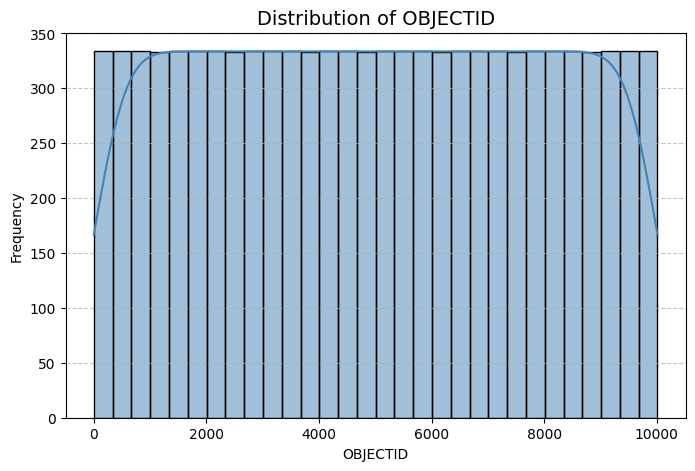

📊 Summary of Latitude:
count    10013.000000
mean        -0.594078
std          1.436301
min         -4.662270
25%         -1.267410
50%         -0.552485
75%          0.094510
max          5.307280
Name: Latitude, dtype: float64
Missing values: 0 



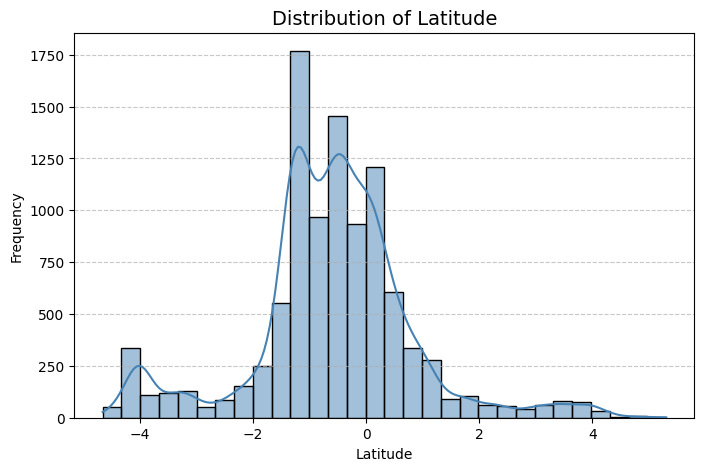

📊 Summary of Longitude:
count    10013.000000
mean        36.723861
std          1.633828
min         33.927900
25%         35.243630
50%         36.831430
75%         37.601720
max         41.888340
Name: Longitude, dtype: float64
Missing values: 0 



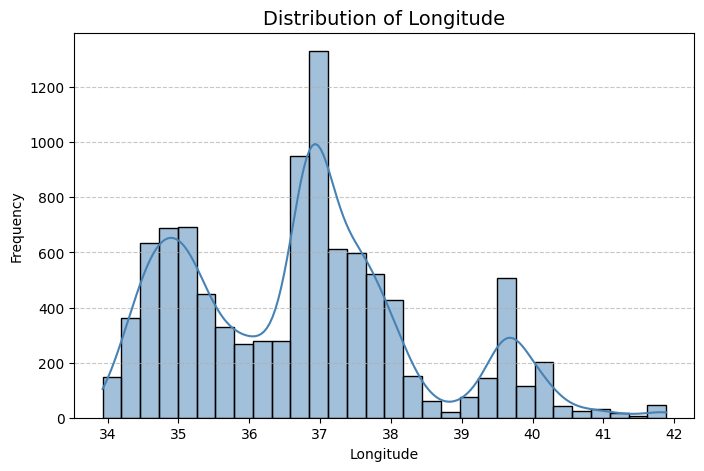


 Numerical summary of Population Data
📊 Summary of Av_HH_Size:
count    47.000000
mean      4.340426
std       0.938931
min       3.000000
25%       4.000000
50%       4.000000
75%       5.000000
max       7.000000
Name: Av_HH_Size, dtype: float64
Missing values: 0 



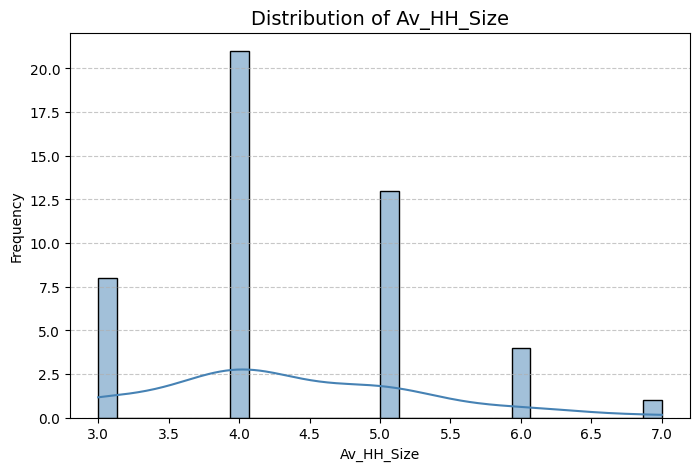

📊 Summary of Intersex population 2019:
count     47.000000
mean      32.425532
std       38.490961
min        2.000000
25%       18.000000
50%       25.000000
75%       34.000000
max      245.000000
Name: Intersex population 2019, dtype: float64
Missing values: 0 



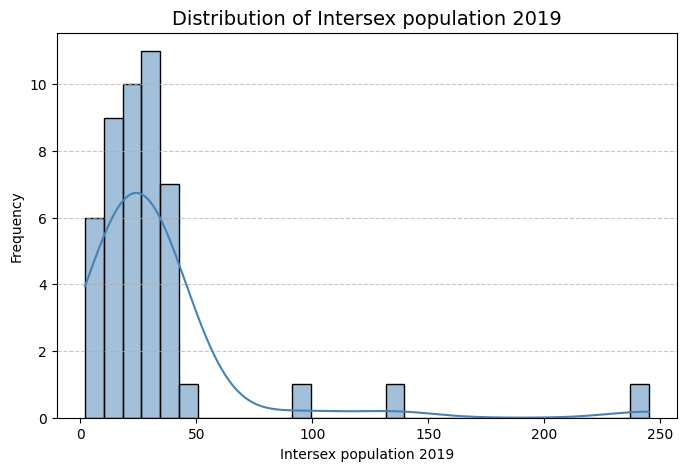


 Numerical summary of County Boundaries
📊 Summary of OBJECTID:
count    48.000000
mean     24.750000
std      14.525839
min       1.000000
25%      12.750000
50%      24.500000
75%      36.250000
max      60.000000
Name: OBJECTID, dtype: float64
Missing values: 0 



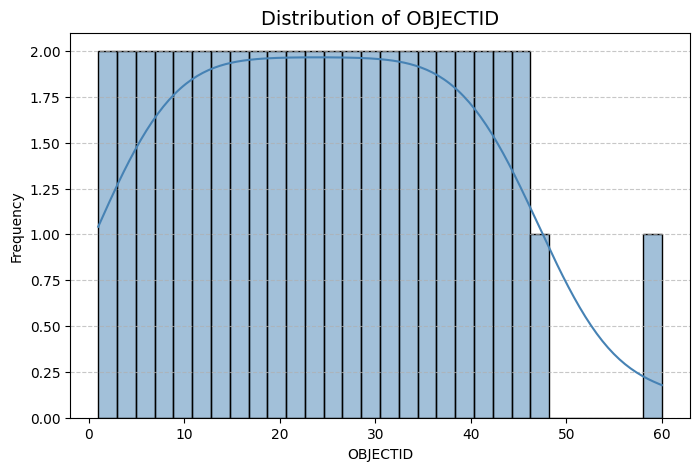

📊 Summary of ID_:
count      48.000000
mean     3247.312500
std      2140.922839
min         0.000000
25%      1385.750000
50%      3337.000000
75%      5198.500000
max      6731.000000
Name: ID_, dtype: float64
Missing values: 0 



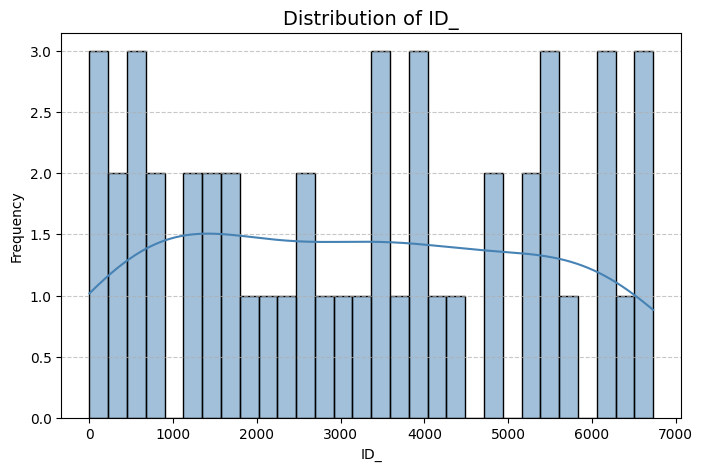

📊 Summary of CONST_CODE:
count     48.000000
mean     127.229167
std       83.919982
min        0.000000
25%       54.250000
50%      126.000000
75%      192.750000
max      288.000000
Name: CONST_CODE, dtype: float64
Missing values: 0 



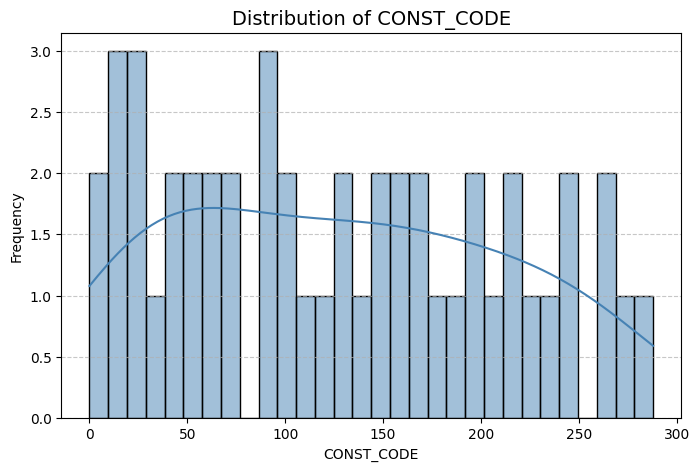

📊 Summary of COUNTY_COD:
count    48.00
mean     23.50
std      14.00
min       0.00
25%      11.75
50%      23.50
75%      35.25
max      47.00
Name: COUNTY_COD, dtype: float64
Missing values: 0 



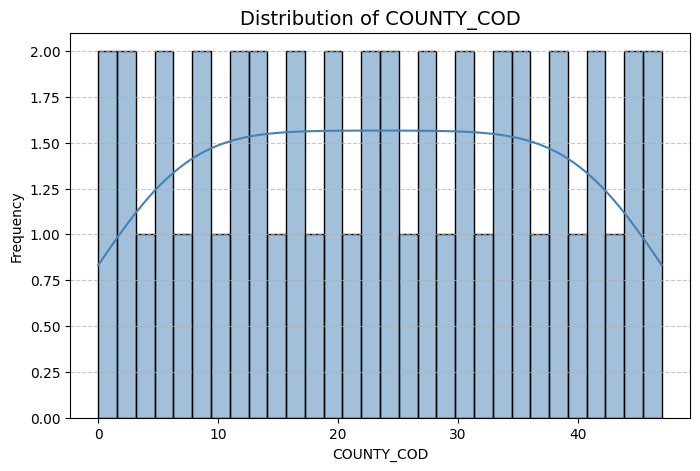

📊 Summary of Shape_Leng:
count    48.000000
mean      4.754913
std       3.104351
min       0.029355
25%       2.840238
50%       3.770496
75%       5.946279
max      14.189874
Name: Shape_Leng, dtype: float64
Missing values: 0 



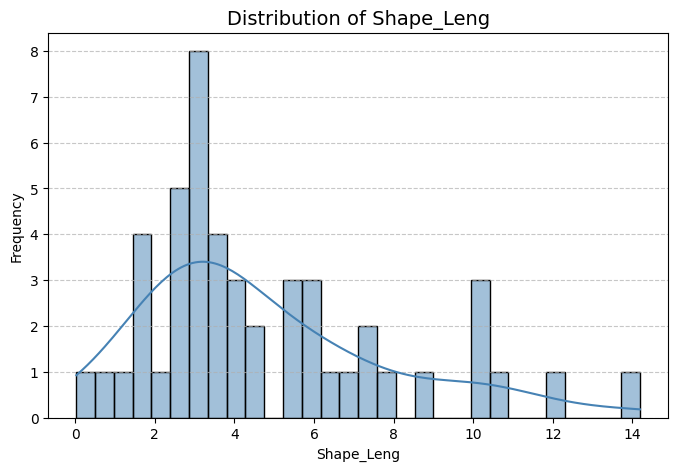

📊 Summary of Shape_Area:
count    48.000000
mean      1.008992
std       1.440495
min       0.000010
25%       0.208855
50%       0.280864
75%       1.117468
max       6.185017
Name: Shape_Area, dtype: float64
Missing values: 0 



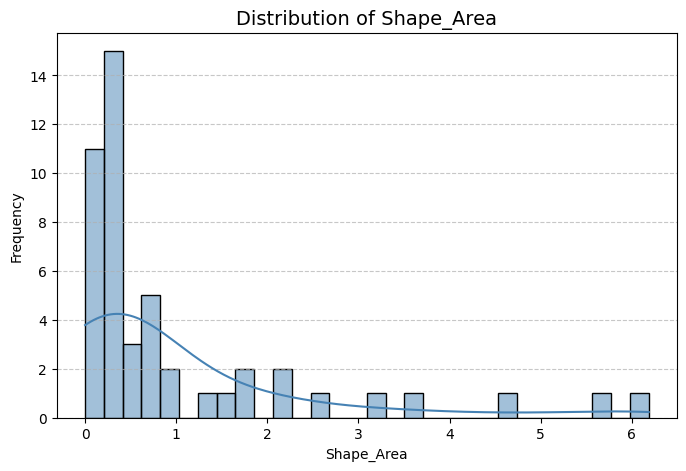


 Numerical summary of Geographical Feature
📊 Summary of building:
count     9994.000000
mean      1237.231539
std       2629.604718
min          0.000000
25%          0.000000
50%        189.000000
75%       1060.750000
max      24366.000000
Name: building, dtype: float64
Missing values: 0 



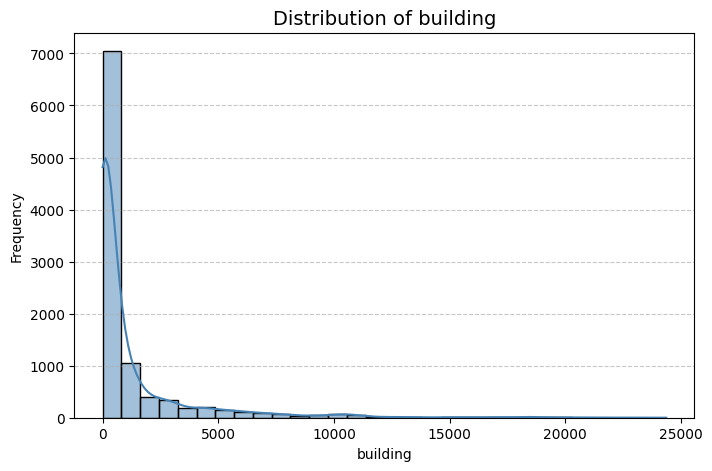

📊 Summary of amenity:
count    9994.000000
mean       50.045928
std       228.259007
min         0.000000
25%         0.000000
50%         1.000000
75%        14.000000
max      2961.000000
Name: amenity, dtype: float64
Missing values: 0 



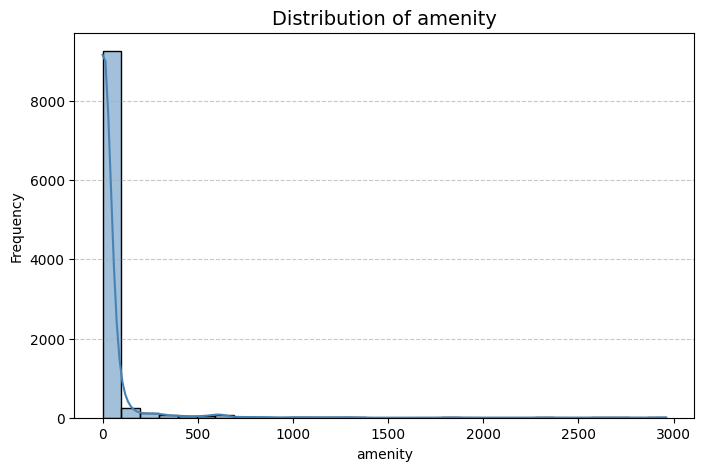

📊 Summary of amenity:school:
count    9994.000000
mean        6.093956
std        26.637717
min         0.000000
25%         0.000000
50%         0.000000
75%         2.000000
max       304.000000
Name: amenity:school, dtype: float64
Missing values: 0 



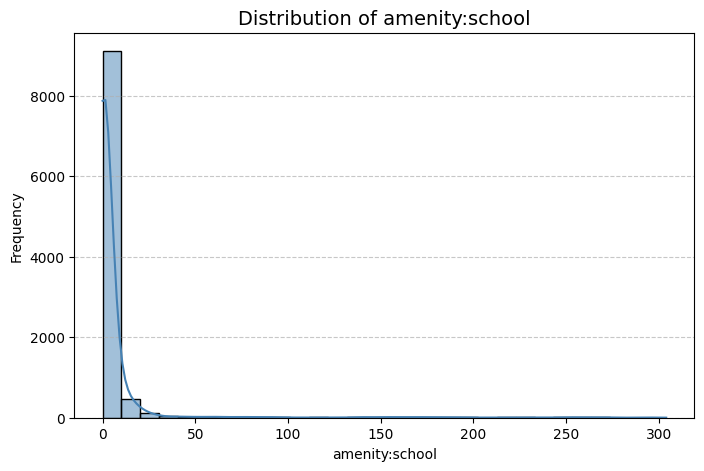

📊 Summary of amenity:hospital:
count    9994.000000
mean        1.029618
std         3.734821
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max        41.000000
Name: amenity:hospital, dtype: float64
Missing values: 0 



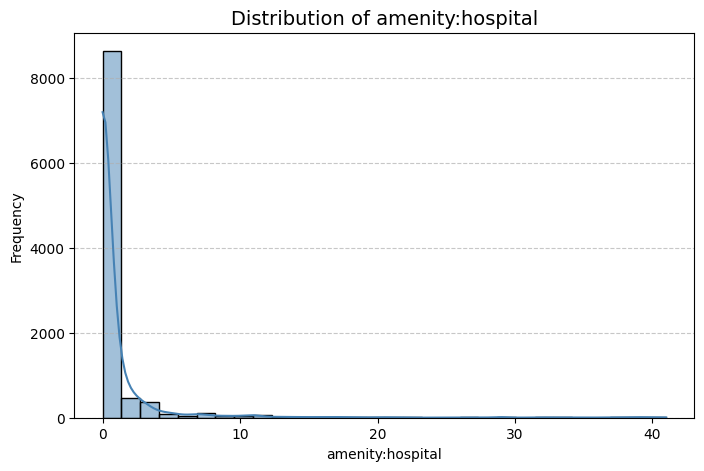

📊 Summary of amenity:restaurant:
count    9994.000000
mean        2.435661
std        10.071679
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max       105.000000
Name: amenity:restaurant, dtype: float64
Missing values: 0 



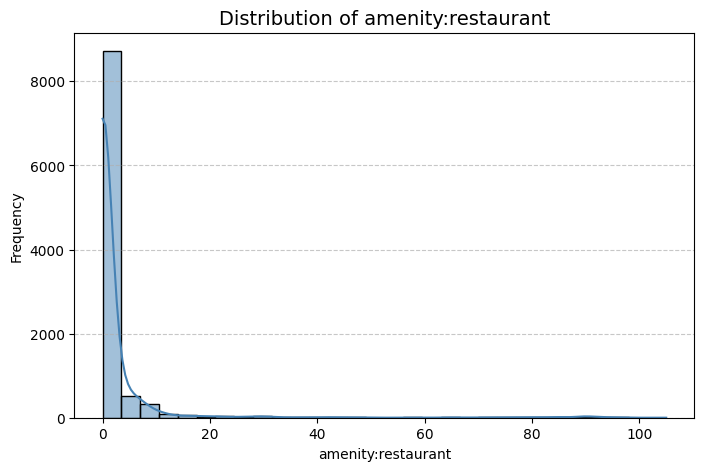

📊 Summary of amenity:cafe:
count    9994.000000
mean        0.438263
std         1.832318
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max        19.000000
Name: amenity:cafe, dtype: float64
Missing values: 0 



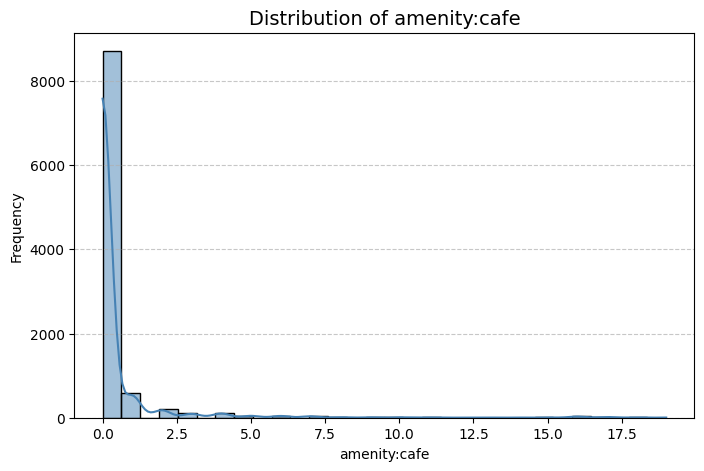

📊 Summary of shop:
count    9994.000000
mean        7.793676
std        32.600715
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max       435.000000
Name: shop, dtype: float64
Missing values: 0 



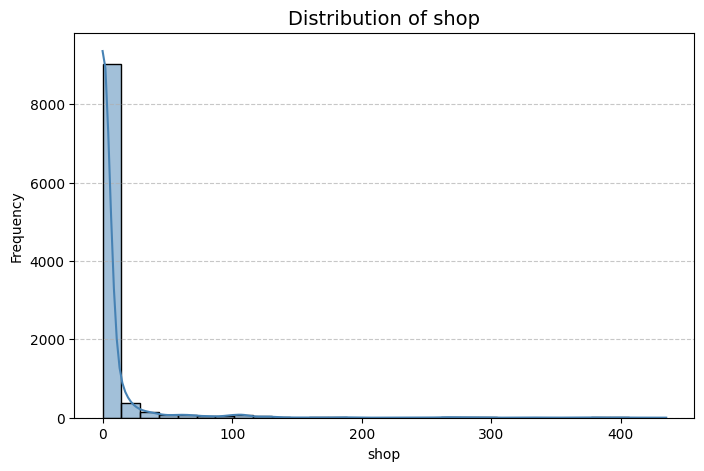

📊 Summary of tourism:
count    9994.000000
mean        2.806684
std         8.840665
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max        91.000000
Name: tourism, dtype: float64
Missing values: 0 



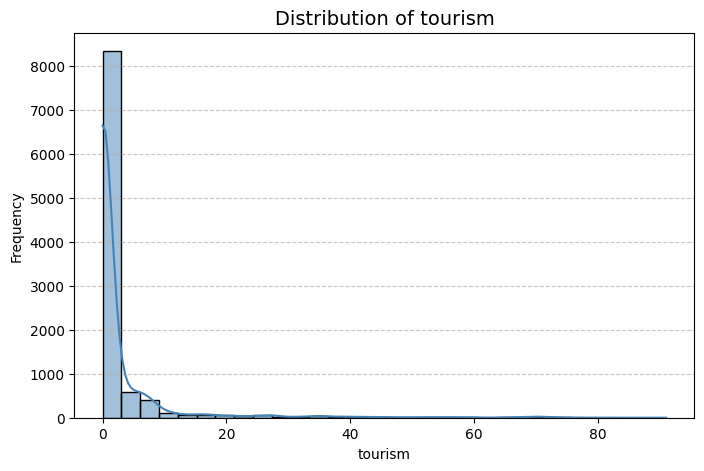

📊 Summary of tourism:hotel:
count    9994.000000
mean        1.684511
std         5.373773
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max        52.000000
Name: tourism:hotel, dtype: float64
Missing values: 0 



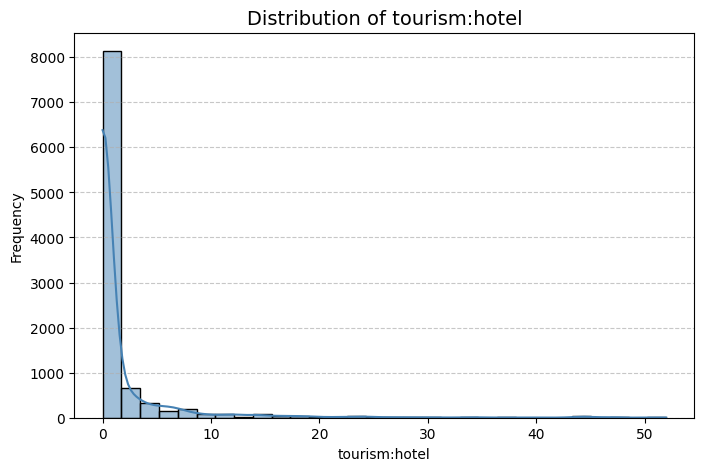

📊 Summary of tourism:museum:
count    9994.000000
mean        0.068041
std         0.453119
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         6.000000
Name: tourism:museum, dtype: float64
Missing values: 0 



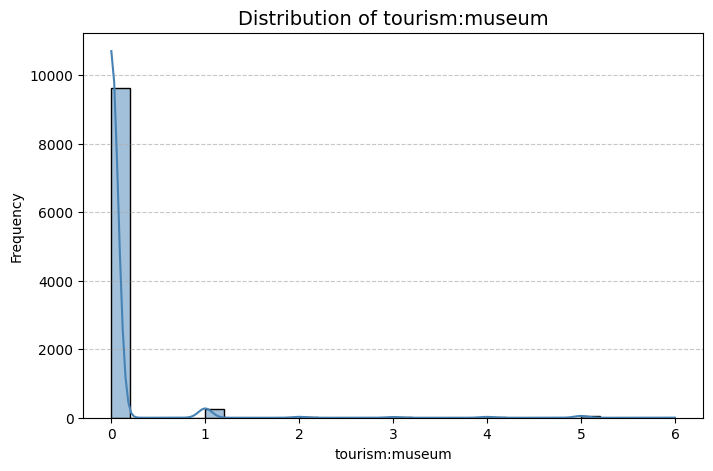

📊 Summary of leisure:
count    9994.000000
mean        3.127076
std        10.039244
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max       116.000000
Name: leisure, dtype: float64
Missing values: 0 



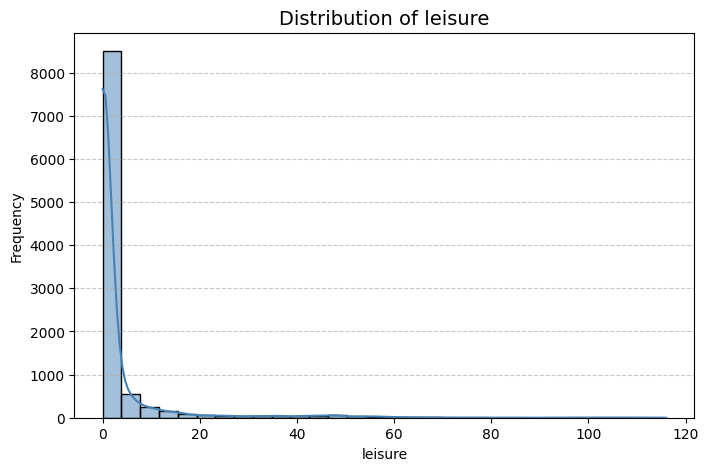

📊 Summary of leisure:park:
count    9994.000000
mean        0.368821
std         1.547620
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max        33.000000
Name: leisure:park, dtype: float64
Missing values: 0 



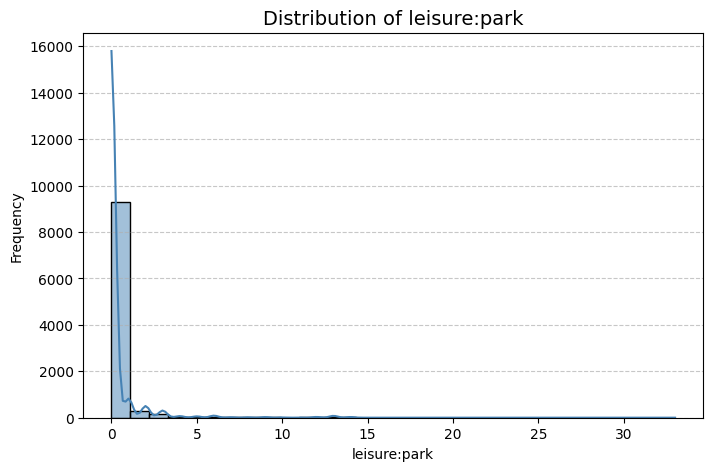

📊 Summary of historic:
count    9994.000000
mean        0.174505
std         1.165469
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max        13.000000
Name: historic, dtype: float64
Missing values: 0 



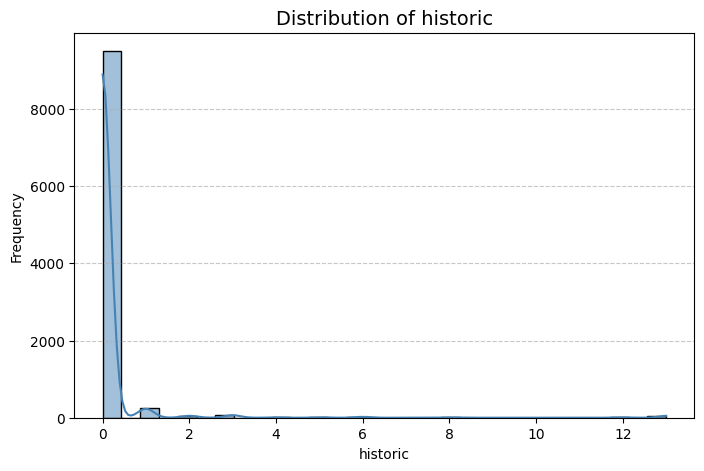

📊 Summary of amenity:place_of_worship:
count    9994.000000
mean        3.605463
std        14.621449
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max       180.000000
Name: amenity:place_of_worship, dtype: float64
Missing values: 0 



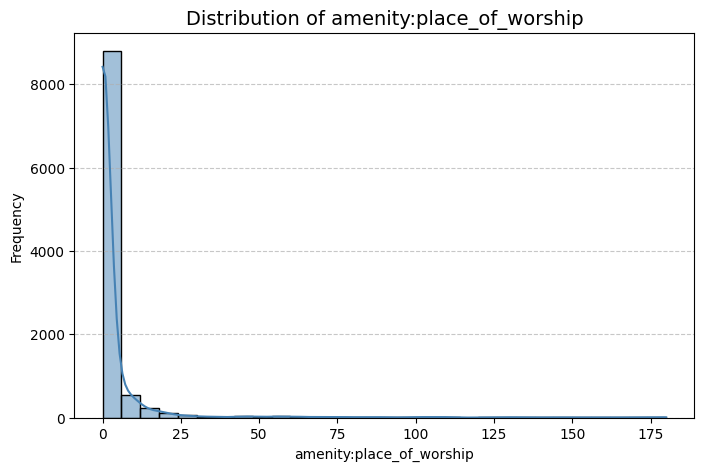

In [14]:
for name, df in datasets.items():
    print(f"\n Numerical summary of {name}")
    fynesse.assess.numerical_summary(df)

`plot_facility_scatterplots()` geenerates scatterplots of *Facility Count* against all other numerical features in the dataset, with points colored by the *Underserved* status.


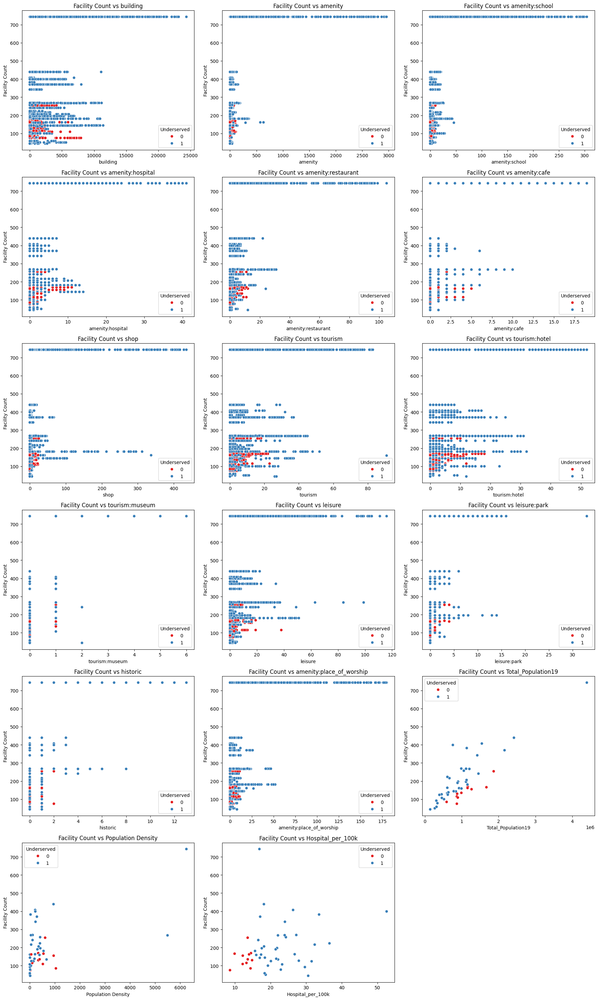

In [15]:

fynesse.assess.plot_facility_scatterplots(merged_data)


`plot_hospitals_per_100k()` produces a boxplot comparing the distribution of *Hospitals per 100k* across underserved and non-underserved groups.

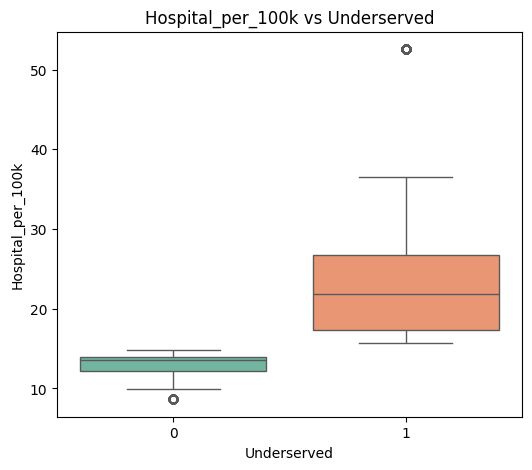

In [16]:
fynesse.assess.plot_hospitals_per_100k(merged_data)

#### **2.4.2 Correlation Analysis**

Correlation analysis is a necessary in the assessment process because it provides insights into the relationships between variables within the dataset. By examining how features move together—whether positively or negatively—it becomes possible to identify which factors are most closely associated with the target variable *underserved*


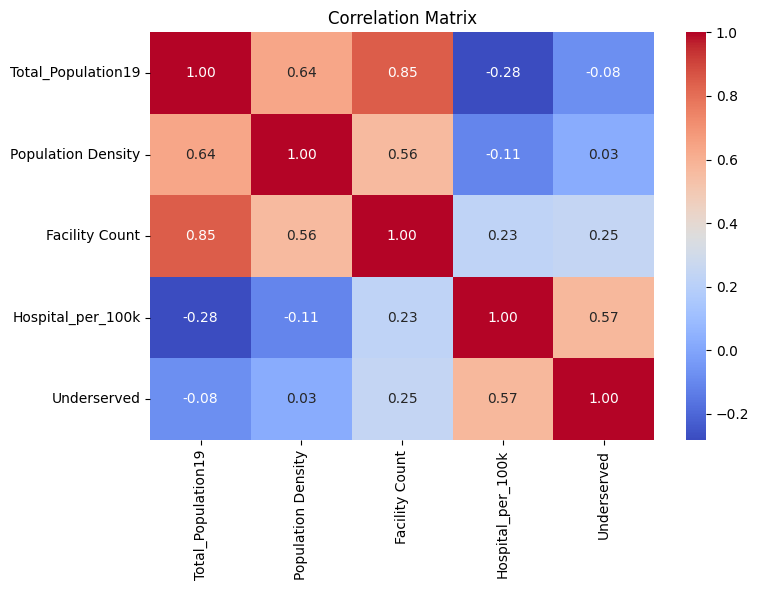

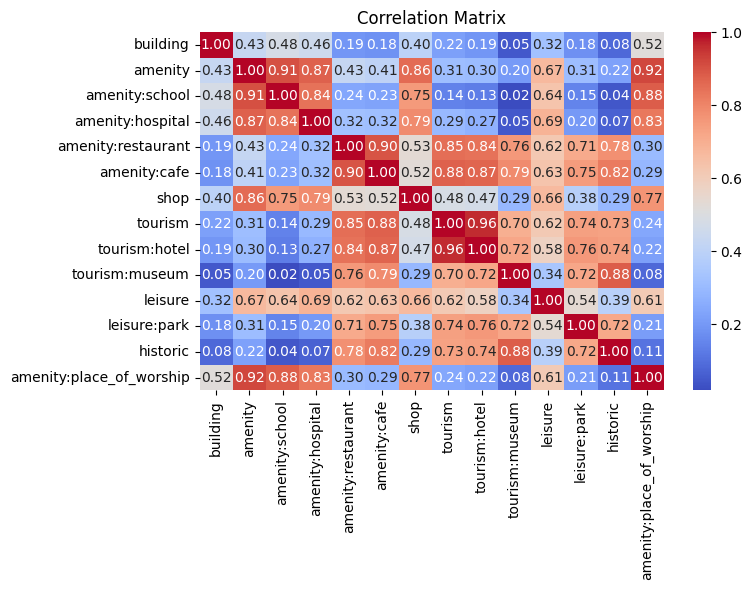

In [17]:
corr_matrix = fynesse.assess.analyse_correlation(preprocessed_data)
corr_matrix = fynesse.assess.analyse_correlation(df_osm_geo_features)

In [18]:
%%capture
corr_matrix = fynesse.assess.analyse_correlation(merged_data)

In [19]:
display(corr_matrix.style.background_gradient(cmap='coolwarm'))

,building,amenity,amenity:school,amenity:hospital,amenity:restaurant,amenity:cafe,shop,tourism,tourism:hotel,tourism:museum,leisure,leisure:park,historic,amenity:place_of_worship,Total_Population19,Population Density,Facility Count,Hospital_per_100k,Underserved
building,1.000000,0.432378,0.481548,0.455309,0.193812,0.180978,0.400420,0.219659,0.191969,0.048623,0.323765,0.177264,0.080455,0.518534,0.557494,0.551396,0.494361,-0.154044,0.118209
amenity,0.432378,1.000000,0.906201,0.873651,0.425403,0.405369,0.857161,0.310696,0.303590,0.203276,0.668251,0.307155,0.222538,0.921521,0.486689,0.491859,0.446289,-0.106451,0.083771
amenity:school,0.481548,0.906201,1.000000,0.842674,0.240130,0.228517,0.754058,0.144301,0.130629,0.018348,0.635606,0.148620,0.041820,0.882855,0.489105,0.491347,0.450247,-0.102503,0.089588
amenity:hospital,0.455309,0.873651,0.842674,1.000000,0.324784,0.316005,0.786550,0.294771,0.271302,0.047356,0.688899,0.199355,0.068035,0.830921,0.440279,0.449328,0.398716,-0.107073,0.073723
amenity:restaurant,0.193812,0.425403,0.240130,0.324784,1.000000,0.899845,0.533370,0.847978,0.839988,0.757898,0.618069,0.711187,0.775227,0.301729,0.460269,0.482638,0.423337,-0.101503,0.077681
amenity:cafe,0.180978,0.405369,0.228517,0.316005,0.899845,1.000000,0.524655,0.875639,0.868735,0.786930,0.634741,0.748604,0.821535,0.290542,0.397176,0.457363,0.370724,-0.081231,0.092877
shop,0.400420,0.857161,0.754058,0.786550,0.533370,0.524655,1.000000,0.482623,0.474130,0.292354,0.664282,0.383297,0.291481,0.767199,0.417177,0.428711,0.371401,-0.118676,0.088919
tourism,0.219659,0.310696,0.144301,0.294771,0.847978,0.875639,0.482623,1.000000,0.963974,0.700499,0.615448,0.736516,0.732468,0.238784,0.364194,0.437556,0.327749,-0.104023,0.086424
tourism:hotel,0.191969,0.303590,0.130629,0.271302,0.839988,0.868735,0.474130,0.963974,1.000000,0.723744,0.578801,0.755395,0.741865,0.221152,0.335552,0.390763,0.304413,-0.093556,0.071797
tourism:museum,0.048623,0.203276,0.018348,0.047356,0.757898,0.786930,0.292354,0.700499,0.723744,1.000000,0.342396,0.721811,0.882339,0.082293,0.255033,0.255192,0.241003,-0.052443,0.038101


#### **2.4.3 Feature Importance**

we evaluate how much each feature contributes to predicting the target variable, *underserved*. Feature importance helps identify which variables have the greatest influence on whether a county or location is categorized as underserved. By quantifying the relative contribution of each feature, we can distinguish between highly informative variables and those that add little value to the analysis. This process not only improves model performance by reducing noise and redundancy but also enhances interpretability, allowing policymakers and planners to understand the key drivers of service gaps.


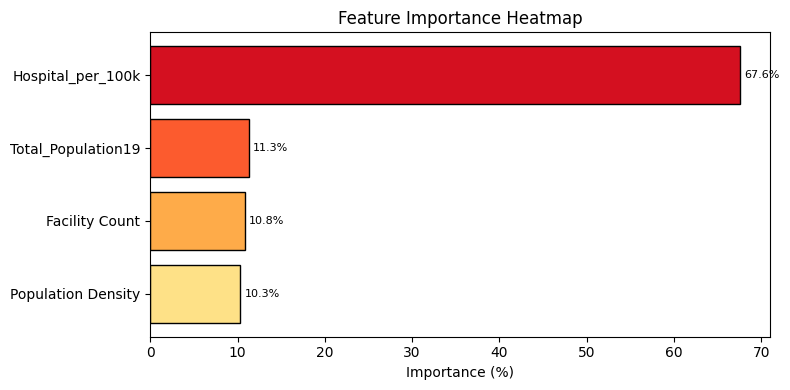

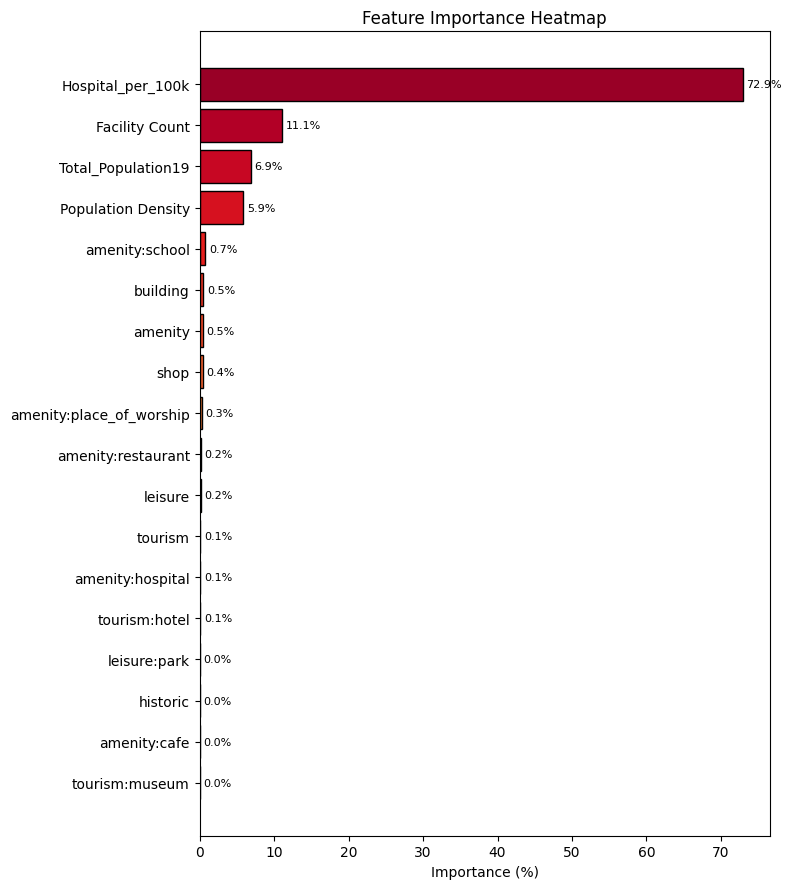

In [20]:
rf_model, importances_df = fynesse.assess.plot_feature_importance_rf(preprocessed_data, target_col="Underserved")
rf_model, importances_df = fynesse.assess.plot_feature_importance_rf(merged_data, target_col="Underserved")


#### **2.4.4 Underserved distribution**

The function `fynesse.assess.plot_underserved_distribution()` visualizes the distribution of the target variable *Underserved* within the dataset. By plotting how many counties classified as underserved versus adequately served, it provides a quick overview of class balance. This is important for understanding whether the dataset is imbalanced, which can affect the reliability of subsequent modeling and analysis.


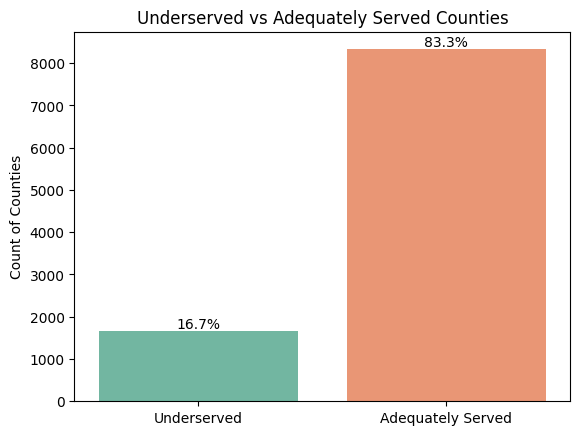

In [21]:
fynesse.assess.plot_underserved_distribution(merged_data,target_col='Underserved')

#### **2.4.5 Visualization of health facility locations across Kenya**

The function `fynesse.assess.plot_health_facilities()` generates a spatial visualization of health facility locations across Kenya, overlaying them on county boundary polygons. By combining the `df_health_facilities` dataset (facility attributes and coordinates) with the `gdf_counties` dataset (county boundaries), it produces a map that highlights how healthcare facilities are distributed geographically.



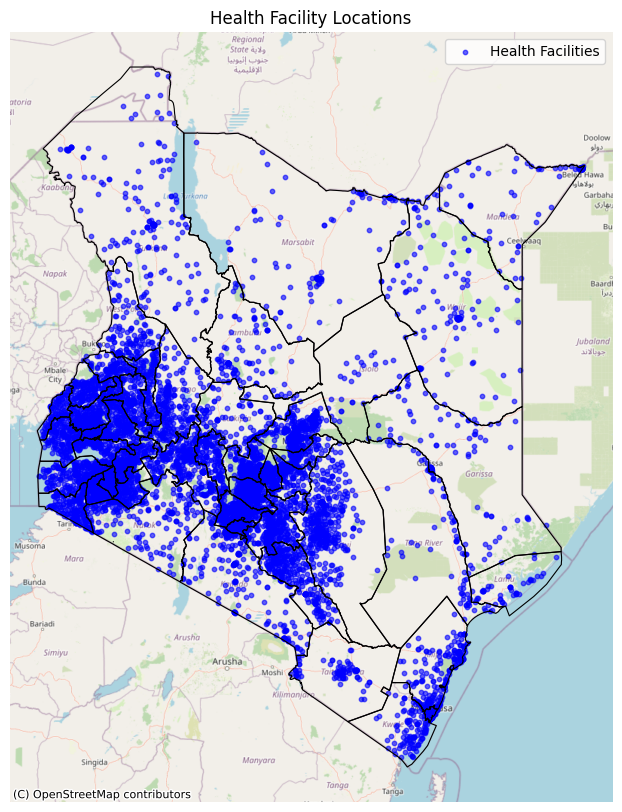

In [22]:
fynesse.assess.plot_health_facilities(df_facilities=df_health_facilities,gdf_counties=gdf_counties)

Spatial visualization of health facility locations across Kenya considering the type of facility

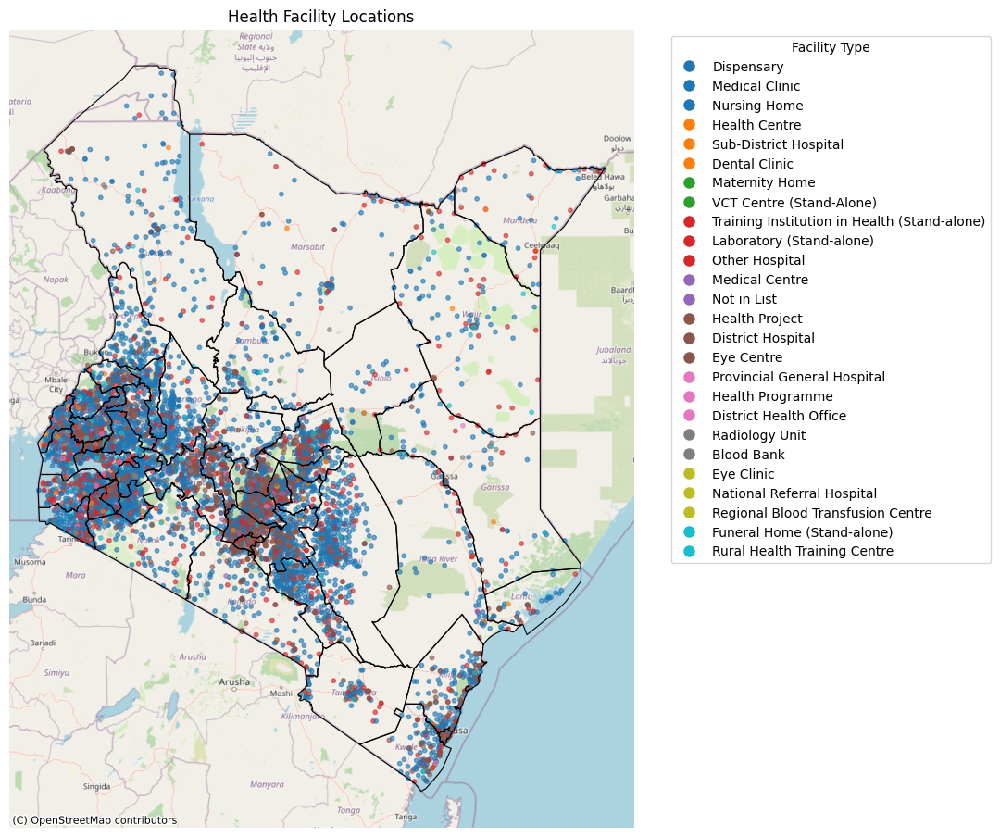

In [23]:
fynesse.assess.plot_health_facilities_byType(df_facilities=df_health_facilities,gdf_counties=gdf_counties)

Generate facility distribution maps for the first ten counties.

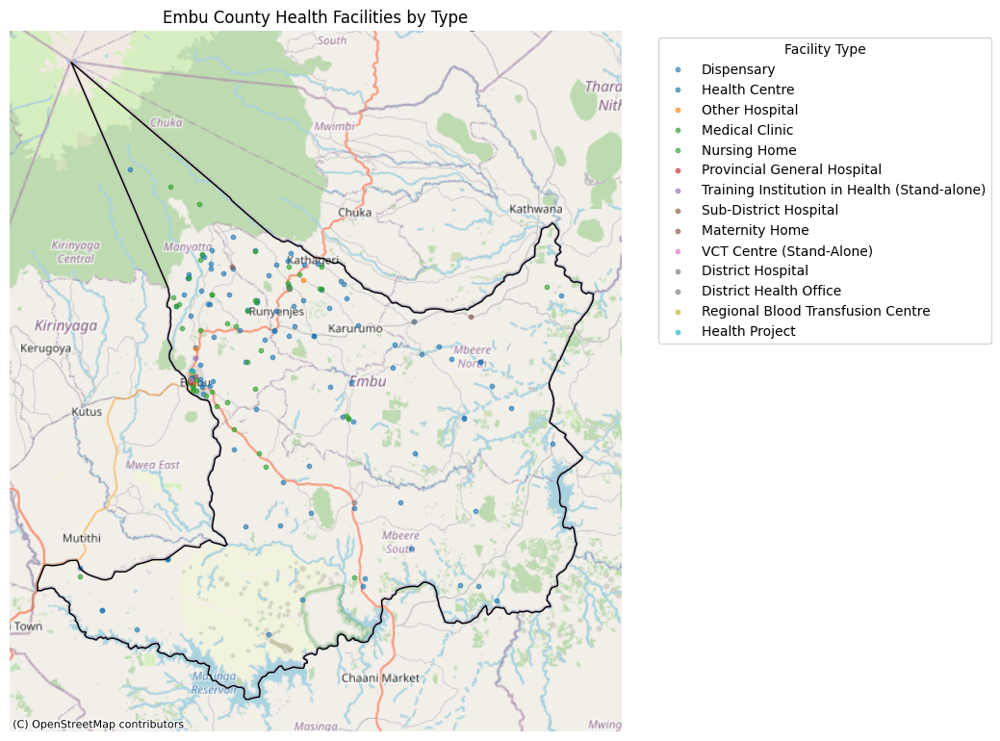

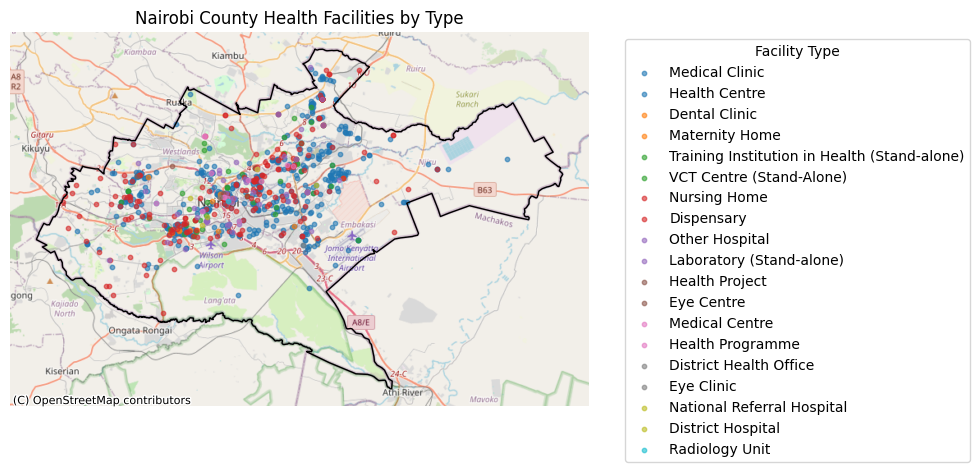

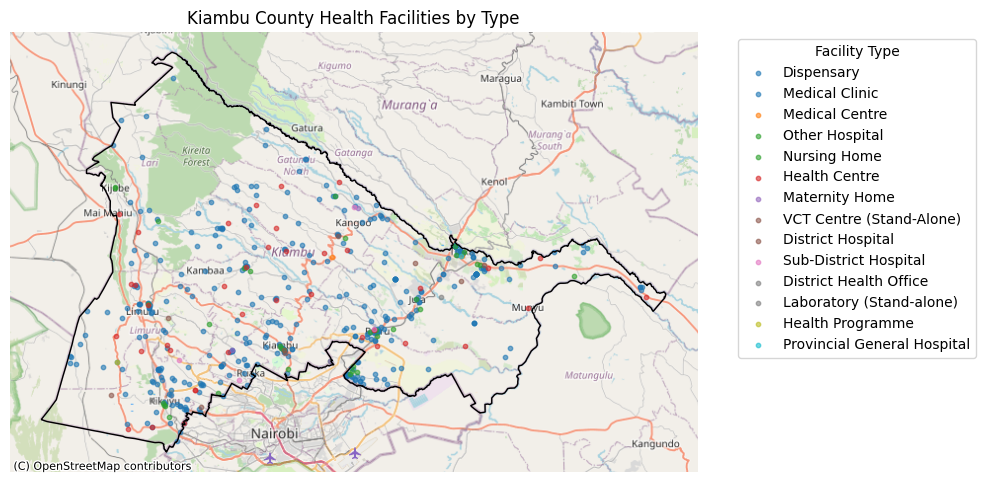

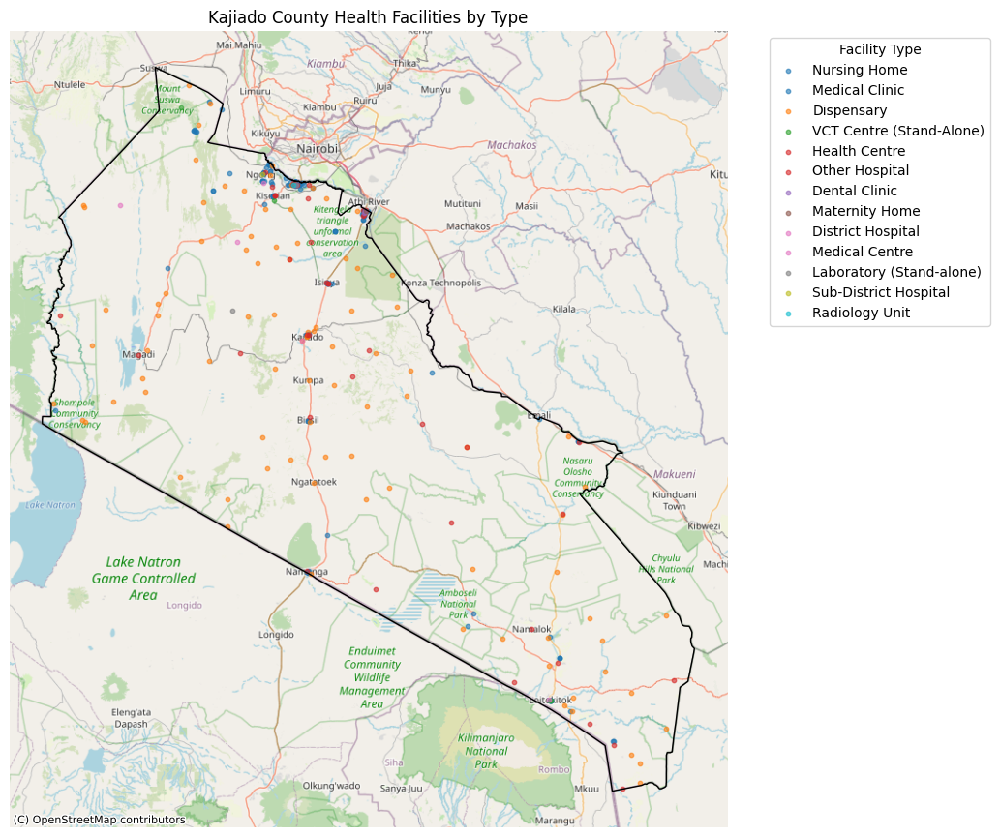

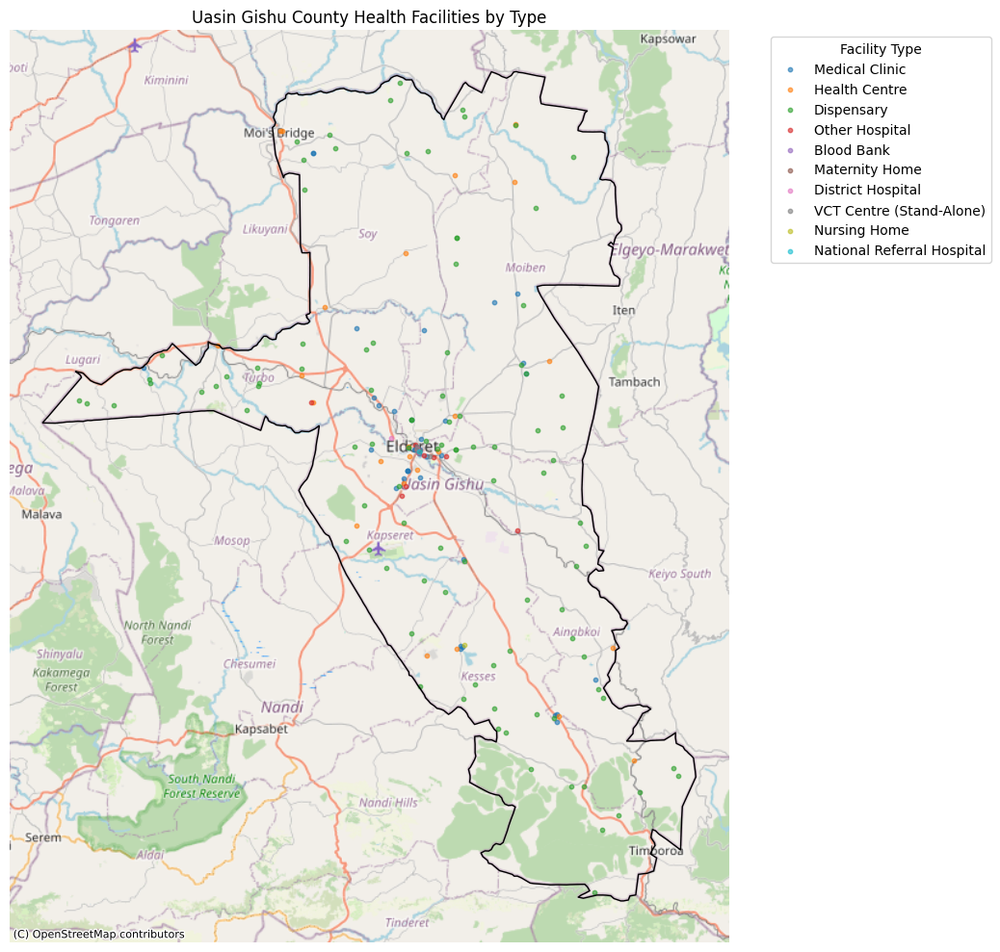

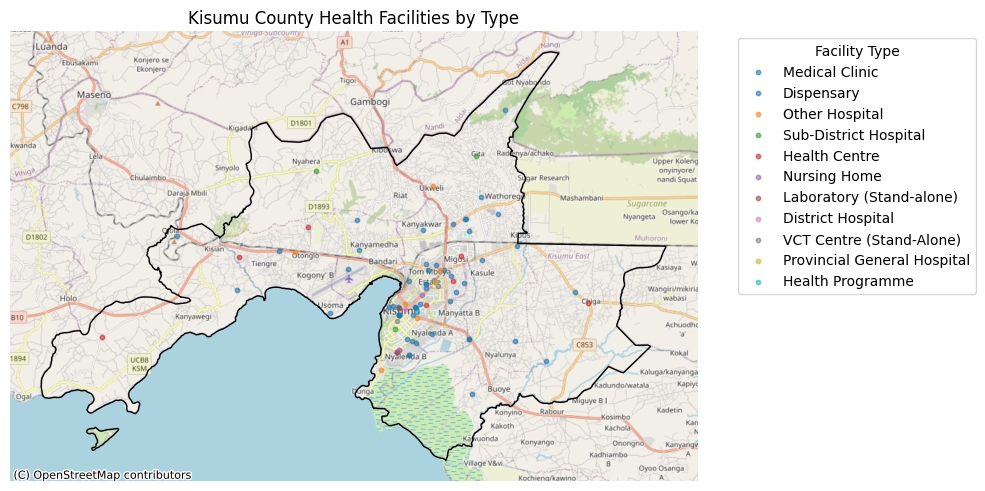

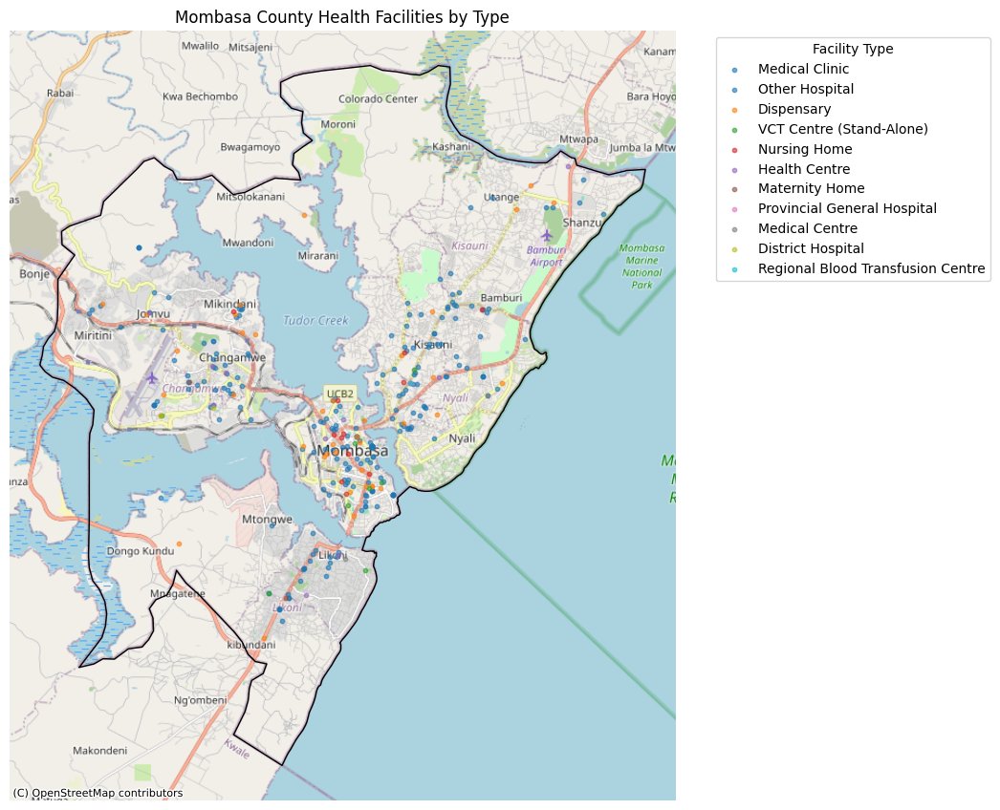

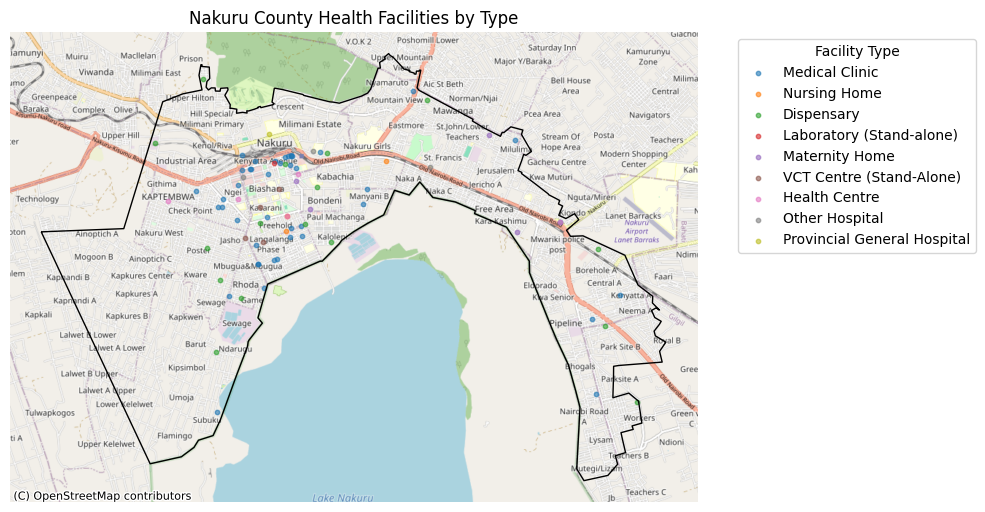

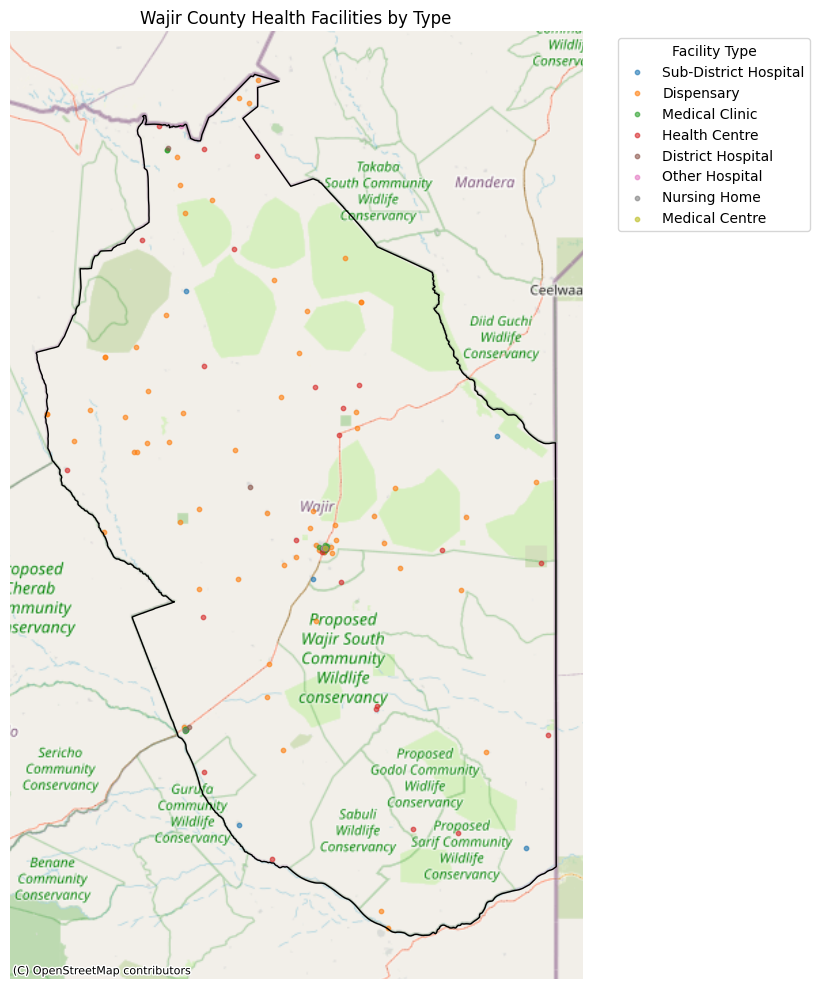

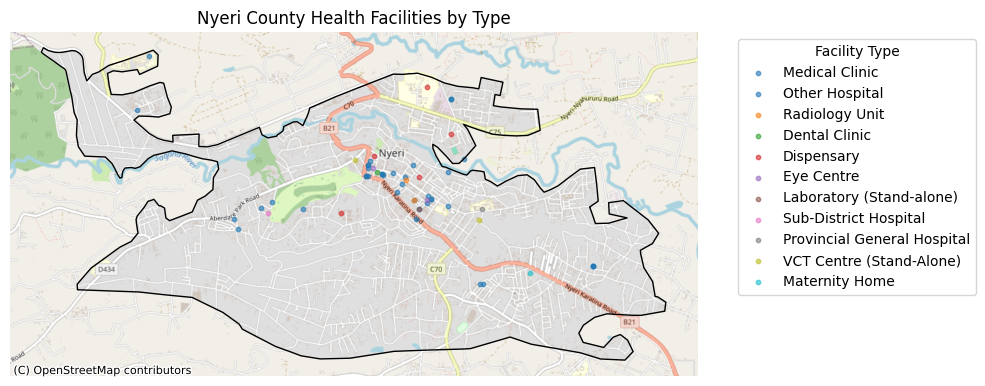

In [24]:
unique_counties = df_health_facilities["County"].dropna().unique()

# Loop through each county and plot
for county in unique_counties[:10]:
    print(" ")
    fynesse.assess.plot_county_facilities(county_name=county,df_facilities=df_health_facilities)

#***Address***

## **3.1 One-hot encoding on County**

In [25]:
encoded_data = pd.get_dummies(merged_data, columns=['County'])
X = encoded_data.drop(columns="Underserved").apply(pd.to_numeric, errors='coerce')
y = encoded_data["Underserved"].astype(int)

## **3.2 Feature Normalization/Standardization**

In [26]:
# scaler = StandardScaler()
# X_scaled = scaler.fit_transform(X)
# X_scaled = pd.DataFrame(X_scaled, columns=X.columns, index=X.index)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


## **3.3 Logistic Regression**

### **3.3.1 Training**

In [27]:
underserved_clf = address.train_underserved_classifier(X_train, y_train)

### **3.3.2 Evaluation**

In [28]:
y_pred = address.evaluate_underserved_classifier(underserved_clf, X_test, y_test)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       497
           1       1.00      1.00      1.00      2502

    accuracy                           1.00      2999
   macro avg       1.00      1.00      1.00      2999
weighted avg       1.00      1.00      1.00      2999



### **3.3.3 Confusion Matrix**

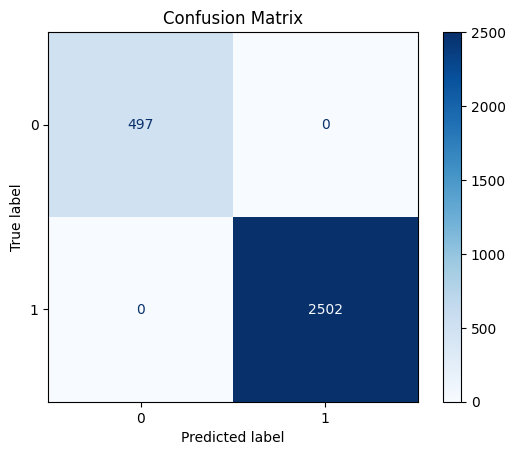

In [29]:
fynesse.address.plot_underserved_confusion_matrix(y_test, y_pred, labels=underserved_clf.classes_)


## **3.4 Naive Bayes**

### **3.4.1 Training the NB model**

In [30]:
nb_model = fynesse.address.train_naive_bayes(X_train, y_train)

### **3.4.2 Evaluation**

In [31]:
fynesse.address.evaluate_naive_bayes(nb_model, X_test, y_test, 0)

'Probability of county being 0: 0.617 | Overall accuracy: 0.534'

### **3.4.3 Plot ROC curve**

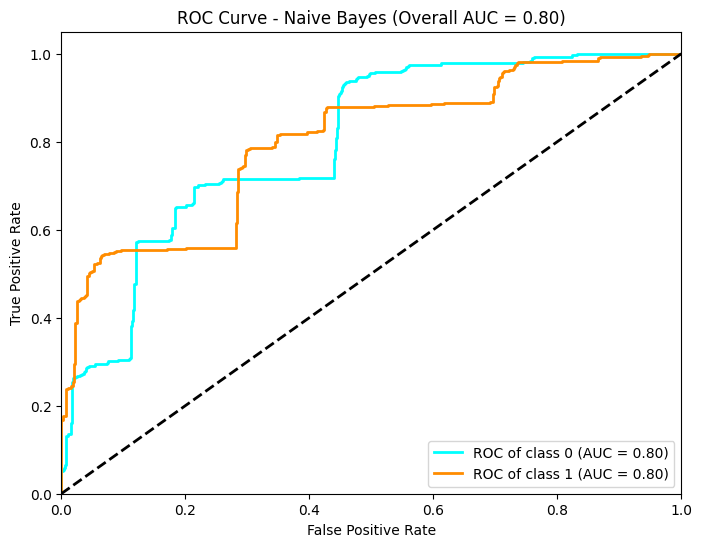

In [32]:
fynesse.address.plot_roc_curve(nb_model,X_test,y_test)